### CH01: Introducing Image Processing and scikit-image

In [1]:
# Import the modules from skimage
from skimage import data, color
from skimage.filters import try_all_threshold, threshold_otsu, threshold_local
import matplotlib.pyplot as plt
import numpy as np

In [2]:
# Load the rocket image
rocket = data.rocket()

In [3]:
print(rocket.size)
np.shape(rocket)

819840


(427, 640, 3)

In [4]:
# Convert the image to grayscale
gray_scaled_rocket = color.rgb2gray(rocket)
rgb_rocket = color.gray2rgb(gray_scaled_rocket)

In [5]:
def show_image(image, title='Image', cmap_type='gray'):
    """Display an image with a title and color map."""
    plt.imshow(image, cmap=cmap_type)
    plt.title(title)
    plt.axis('off')
    plt.show()

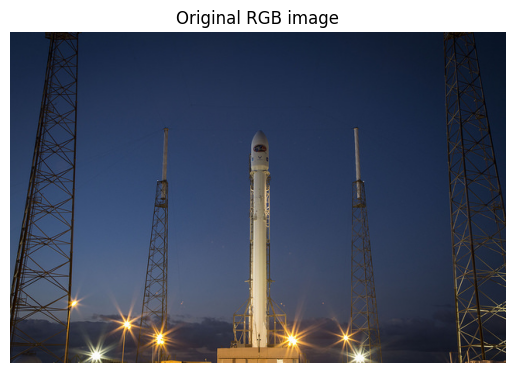

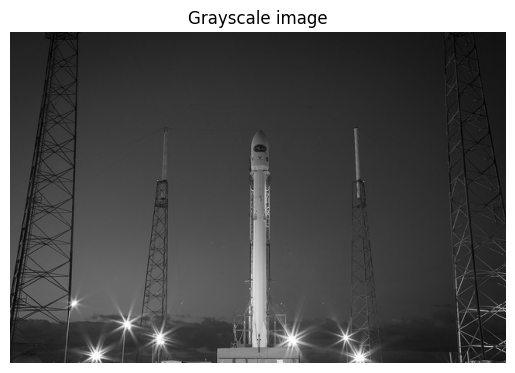

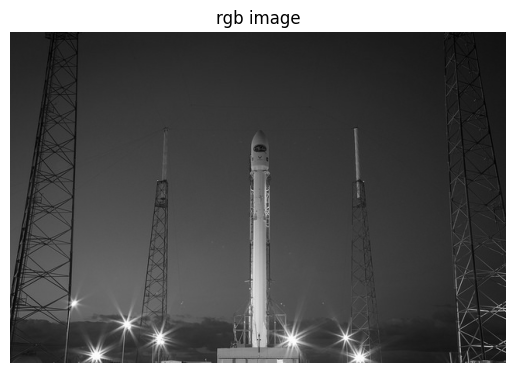

In [6]:
# Show the original image
show_image(rocket, 'Original RGB image')

# Show the grayscale image
show_image(gray_scaled_rocket, 'Grayscale image')

# Show the rgb image
show_image(rgb_rocket, 'rgb image')

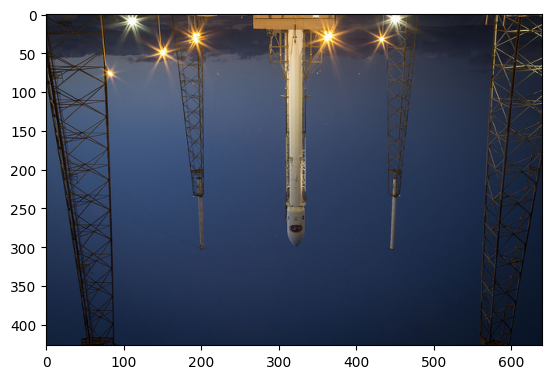

In [7]:
# flip the image vertically
rocket_vertical_flip = np.flipud(rocket)
plt.imshow(rocket_vertical_flip)

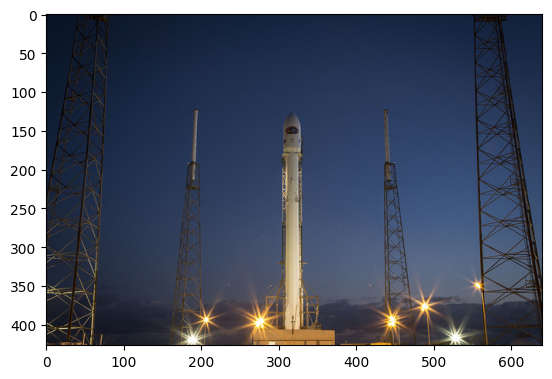

In [8]:
# Convert the image to grayscale
rocket_horizontal_flip = np.fliplr(rocket)
plt.imshow(rocket_horizontal_flip)

In [9]:
# channel separation
red_channel = rocket[:, :, 0]
green_channel = rocket[:, :, 1]
blue_channel = rocket[:, :, 2]

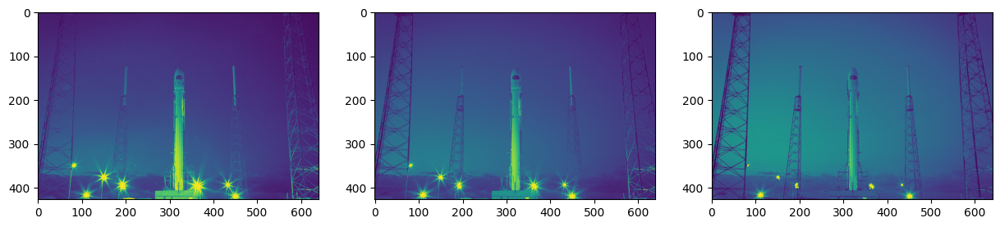

In [10]:
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].imshow(red_channel)
axes[1].imshow(green_channel)
axes[2].imshow(blue_channel)
plt.show()

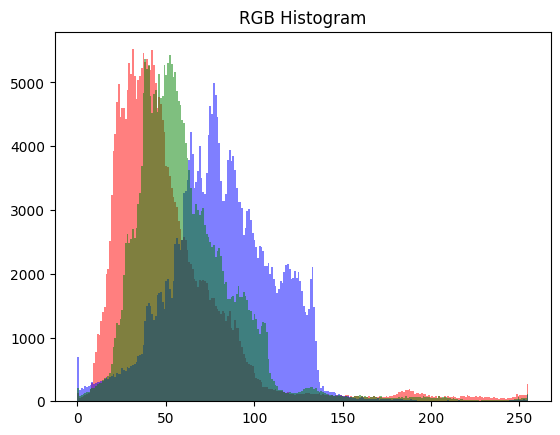

In [11]:
# Plot the rgb histogram with bins in a range of 256
plt.hist(red_channel.ravel(), bins=256, color='red', alpha=0.5)
plt.hist(blue_channel.ravel(), bins=256, color='b', alpha=0.5)
plt.hist(green_channel.ravel(), bins=256, color='g', alpha=0.5)
# Set title and show
plt.title('RGB Histogram')
plt.show()

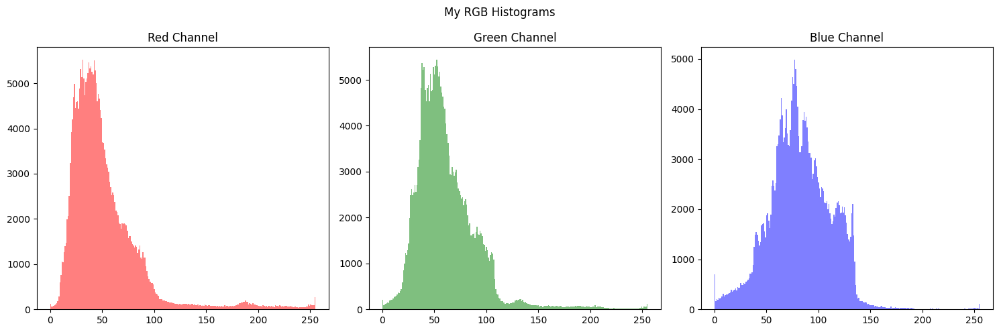

In [12]:
# Create a figure with three subplots
fig, axes = plt.subplots(1, 3, figsize=(15, 5))

# Plot the Red histogram in the first subplot
axes[0].hist(red_channel.ravel(), bins=256, color='red', alpha=0.5)
axes[0].set_title('Red Channel')

# Plot the Green histogram in the second subplot
axes[1].hist(green_channel.ravel(), bins=256, color='green', alpha=0.5)
axes[1].set_title('Green Channel')

# Plot the Blue histogram in the third subplot
axes[2].hist(blue_channel.ravel(), bins=256, color='blue', alpha=0.5)
axes[2].set_title('Blue Channel')

# Adjust layout and show the figure
fig.suptitle('My RGB Histograms')
plt.tight_layout()
plt.show()



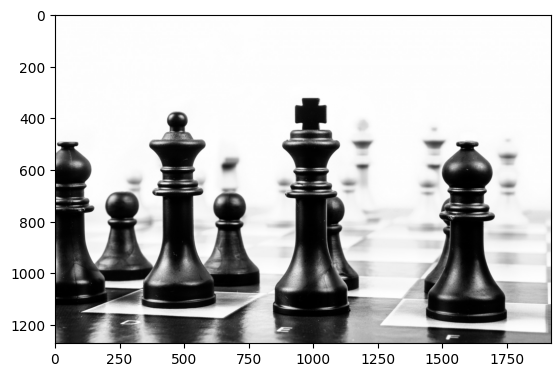

In [13]:
chess_pieces_image = plt.imread("dataset/chapter 1/bw.jpg")
plt.imshow(chess_pieces_image)

In [14]:
# Make the image grayscale using rgb2gray
chess_pieces_image_gray = color.rgb2gray(chess_pieces_image)

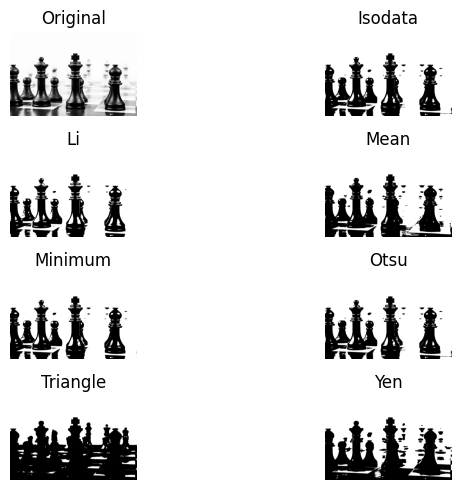

In [15]:
# Obtain all the resulting images
fig, ax = try_all_threshold(chess_pieces_image_gray, verbose=False)
plt.show()


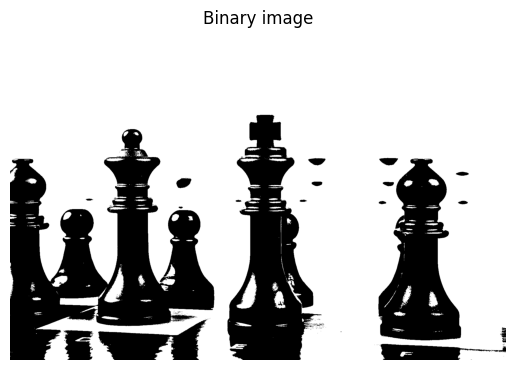

In [16]:
# Obtain the optimal threshold value with otsu
thresh = threshold_otsu(chess_pieces_image_gray)

# Apply thresholding to the image
binary = chess_pieces_image_gray > thresh

# Show the image
show_image(binary, 'Binary image')

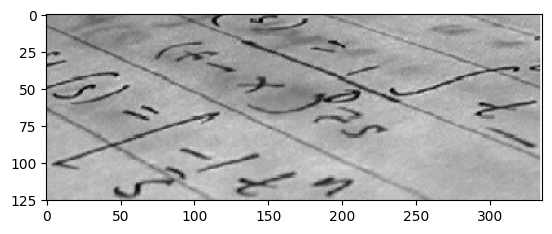

In [17]:
page_image = plt.imread("dataset/chapter 1/uneven_background.png")
plt.imshow(page_image)

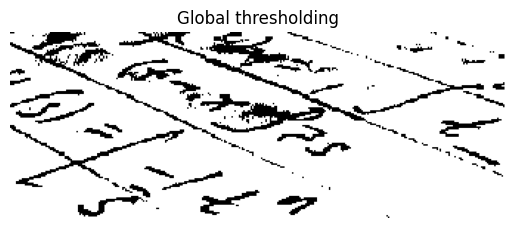

In [18]:
# Remove the alpha channel if present
if page_image.shape[-1] == 4:
	page_image = page_image[:, :, :3]

# Make the image grayscale using rgb2gray
page_image_gray = color.rgb2gray(page_image)

# Obtain the optimal otsu global thresh value
global_thresh = threshold_otsu(page_image_gray)

# Obtain the binary image by applying global thresholding
binary_global = page_image_gray > global_thresh

# Show the binary image obtained
show_image(binary_global, 'Global thresholding')

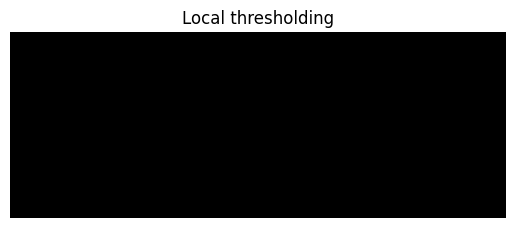

In [19]:
# Set the block size to 35
block_size = 35

# Obtain the optimal local thresholding
local_thresh = threshold_local(page_image_gray, block_size, offset=10)

# Obtain the binary image by applying local thresholding
binary_local = page_image_gray > local_thresh

# Show the binary image
show_image(binary_local, 'Local thresholding')

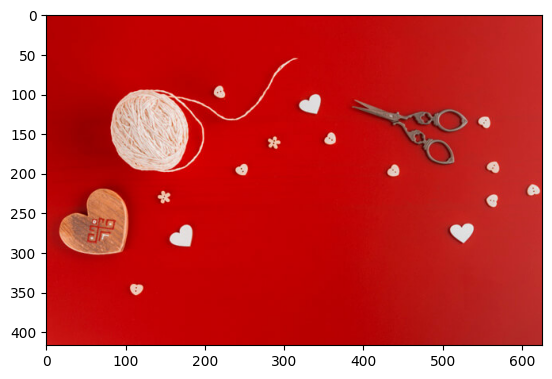

In [20]:
tools_image = plt.imread("dataset/chapter 1/shapes52.jpg")
plt.imshow(tools_image)

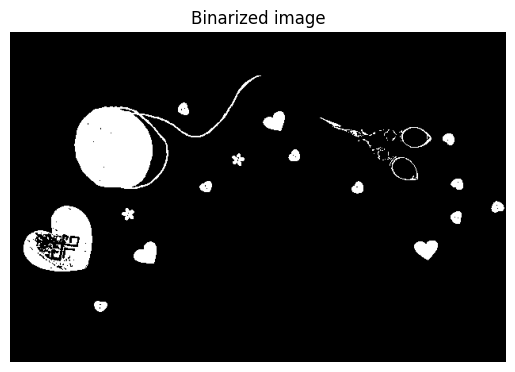

In [21]:
# Turn the image grayscale
gray_tools_image = color.rgb2gray(tools_image)

# Obtain the optimal thresh
thresh = threshold_otsu(gray_tools_image)

# Obtain the binary image by applying thresholding
binary_image = gray_tools_image > thresh

# Show the resulting binary image
show_image(binary_image, 'Binarized image')

---------------------
### CH02: Filters, Contrast, Transformation and Morphology

In [22]:
# Import the color module
from skimage import color

# Import the filters module and sobel function
from skimage.filters import sobel
from skimage.filters import gaussian

# Import the required module
from skimage import exposure
from skimage.transform import rotate, rescale, resize
from skimage import morphology


Edge detection task


In [23]:
soaps_image = plt.imread("dataset/chapter 2/soap_image.jpg")

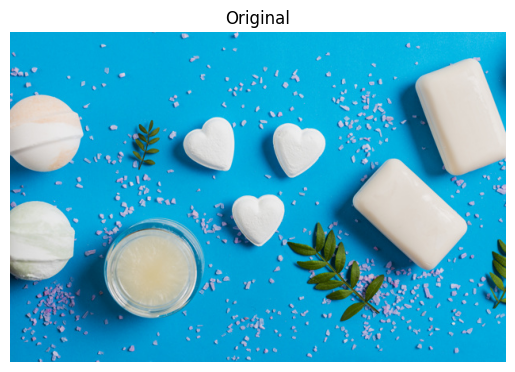

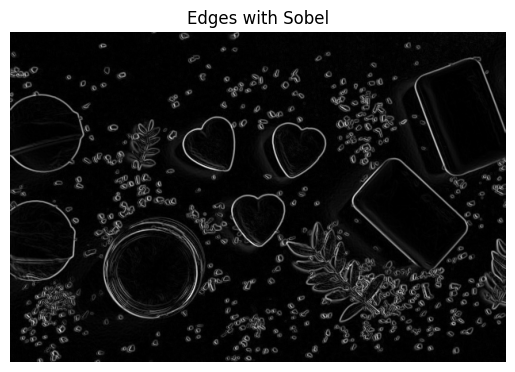

In [24]:
# Make the image grayscale
soaps_image_gray = color.rgb2gray(soaps_image)

# Apply edge detection filter
edge_sobel = sobel(soaps_image_gray)

# Show original and resulting image to compare
show_image(soaps_image, "Original")
show_image(edge_sobel, "Edges with Sobel")

Blurring to reduce noise task

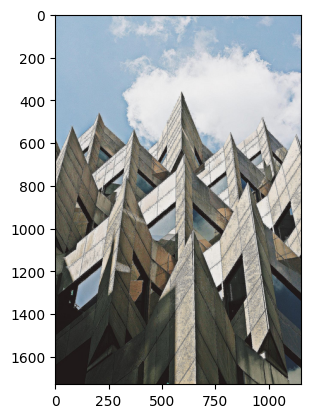

In [25]:
building_image = plt.imread("dataset/chapter 2/building_image.jpg")
plt.imshow(building_image)

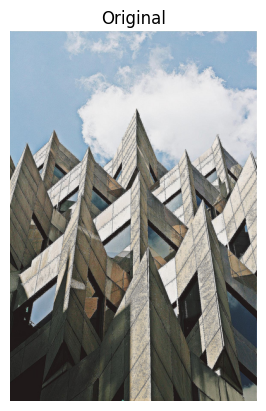

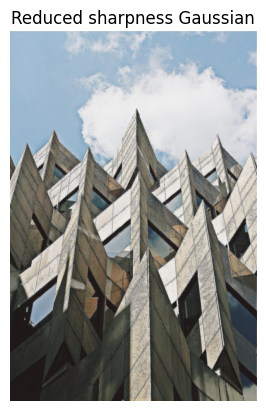

In [26]:
# Apply filter
gaussian_image = gaussian(building_image, channel_axis=-1)

# Show original and resulting image to compare
show_image(building_image, "Original")
show_image(gaussian_image, "Reduced sharpness Gaussian")

#### Contrast enhancement

In [27]:
# You can obtain the maximum pixel intensity of the image by using the np.max() method from NumPy 
# and the minimum with np.min()
# The contrast = max - min
gray_scaled_rocket = color.rgb2gray(rocket)
max_pixel_intensity = np.max(gray_scaled_rocket)
min_pixel_intensity = np.min(gray_scaled_rocket)
contrast = max_pixel_intensity - min_pixel_intensity
print("The contrast: ", contrast)

The contrast:  1.0


Medical images

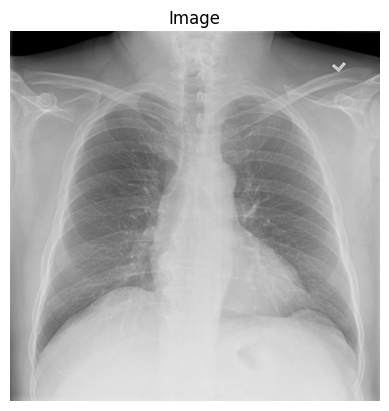

In [28]:
chest_xray_image = plt.imread("dataset/chapter 2/chest_xray_image.png")
show_image(chest_xray_image)

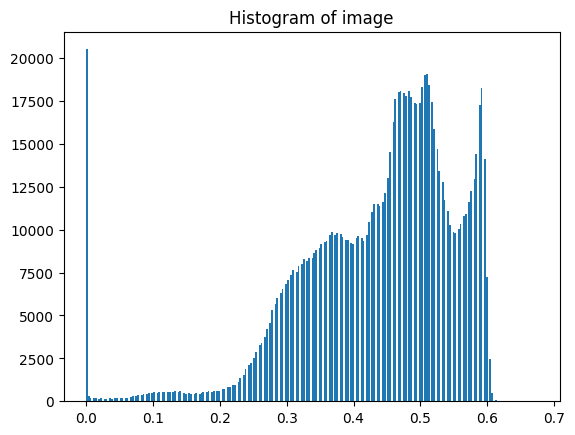

In [29]:
plt.title('Histogram of image')
plt.hist(chest_xray_image.ravel(), bins=256)
plt.show()

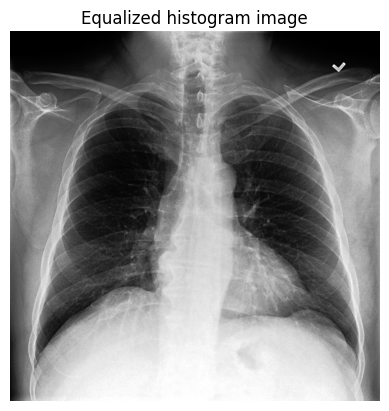

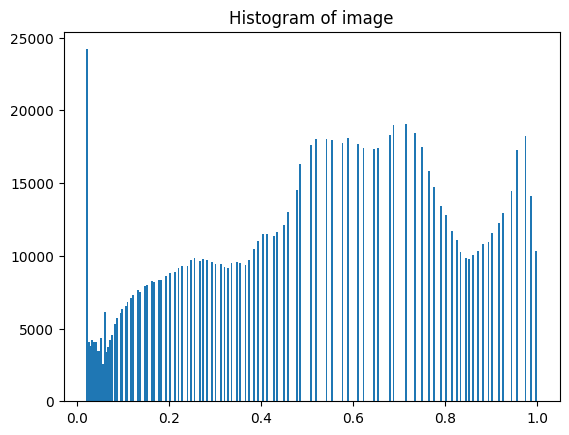

In [30]:
xray_image_eq = exposure.equalize_hist(chest_xray_image)
show_image(xray_image_eq, 'Equalized histogram image')
plt.title('Histogram of image')
plt.hist(xray_image_eq.ravel(), bins=256)
plt.show()

Aerial image

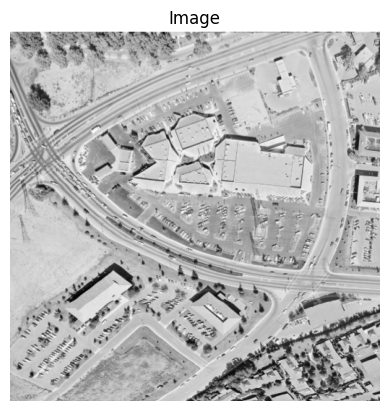

In [31]:
image_aerial = plt.imread("dataset/chapter 2/image_aerial.tiff")
show_image(image_aerial)

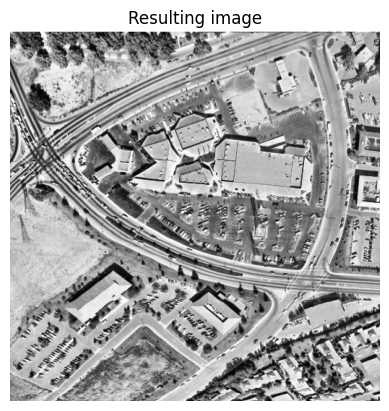

In [32]:
# Use histogram equalization to improve the contrast
image_eq =  exposure.equalize_adapthist(image_aerial)

# Show the original and resulting image
show_image(image_eq, 'Resulting image')

add some impact and contrast

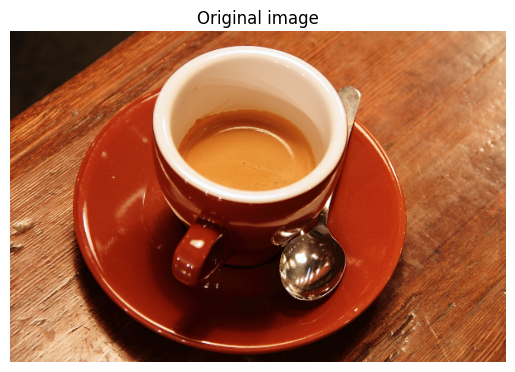

In [33]:
original_image = data.coffee()
show_image(original_image, 'Original image')

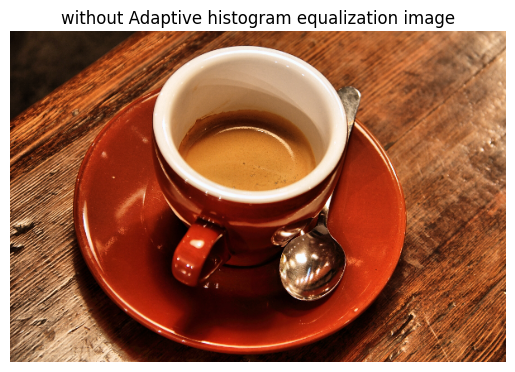

In [34]:
without_adapthist_eq_image = exposure.equalize_adapthist(original_image)
show_image(without_adapthist_eq_image, 'without Adaptive histogram equalization image')

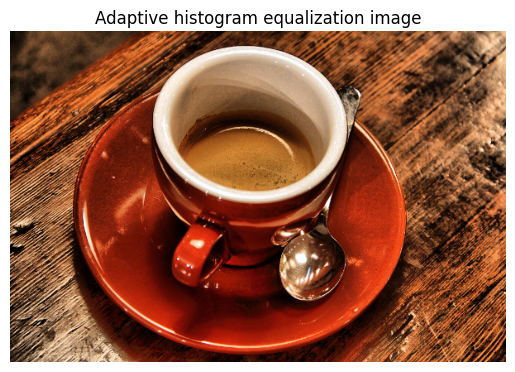

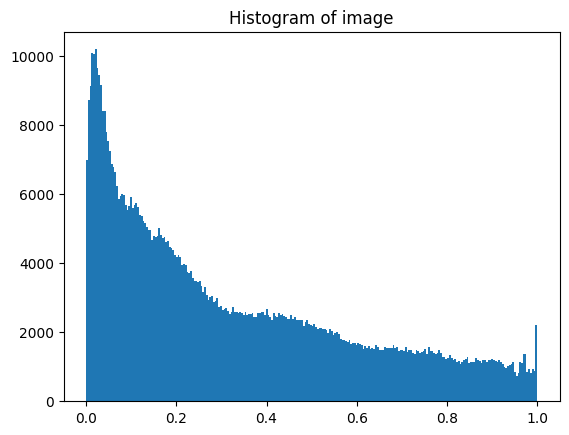

In [35]:
adapthist_eq_image = exposure.equalize_adapthist(original_image, clip_limit=0.03)
show_image(adapthist_eq_image, 'Adaptive histogram equalization image')
plt.title('Histogram of image')
plt.hist(adapthist_eq_image.ravel(), bins=256)
plt.show()

#### Transformations

Aliasing, rotating and rescaling


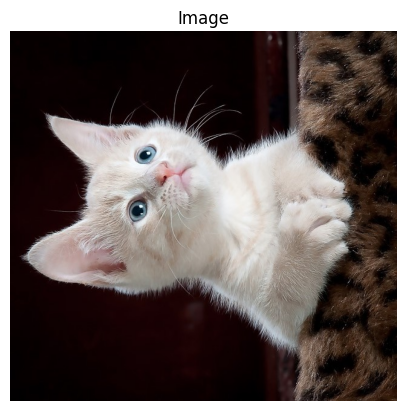

In [36]:
image_cat = plt.imread("dataset/chapter 2/image_cat.jpg")
show_image(image_cat)

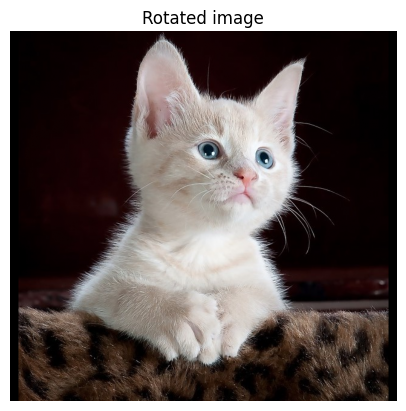

In [37]:
# Rotate the image 90 degrees clockwise 
rotated_cat_image = rotate(image_cat, -90)
show_image(rotated_cat_image, 'Rotated image')

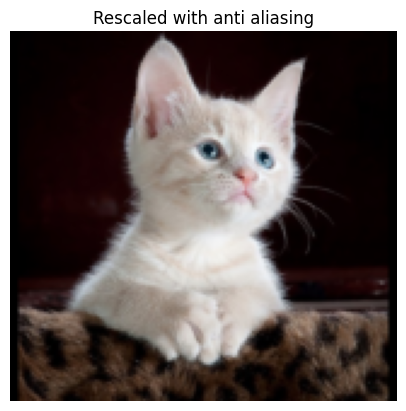

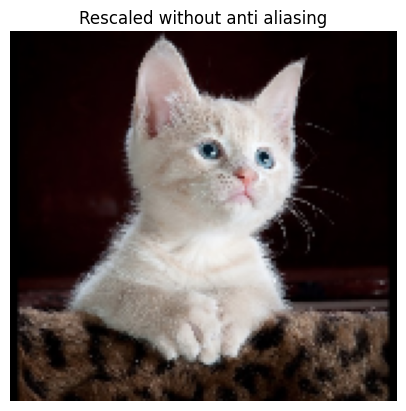

In [38]:
# Rescale with anti aliasing
rescaled_with_aa = rescale(rotated_cat_image, 1/4, anti_aliasing=True, channel_axis=-1)
show_image(rescaled_with_aa, 'Rescaled with anti aliasing')

# Rescale without anti aliasing
rescaled_without_aa = rescale(rotated_cat_image, 1/4, anti_aliasing=False, channel_axis=-1)
show_image(rescaled_without_aa, 'Rescaled without anti aliasing')

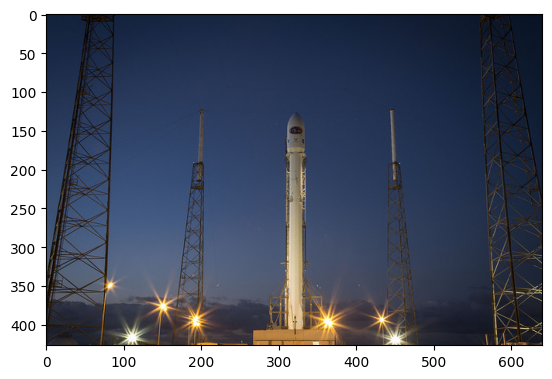

In [39]:
# Load the image from data
rocket_image = data.rocket()

# Enlarge the image so it is 3 times bigger
enlarged_rocket_image = rescale(rocket_image, 3, anti_aliasing=True, channel_axis=-1)

# Show original and resulting image
plt.imshow(rocket_image)


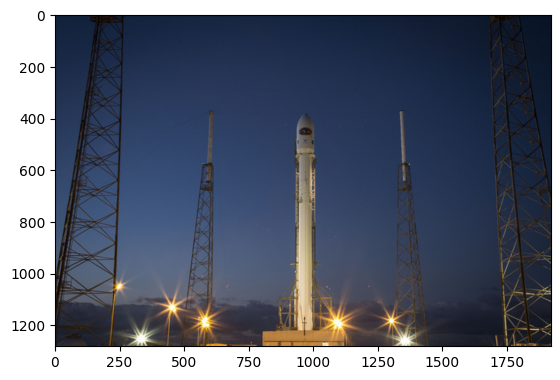

In [40]:
plt.imshow(enlarged_rocket_image)

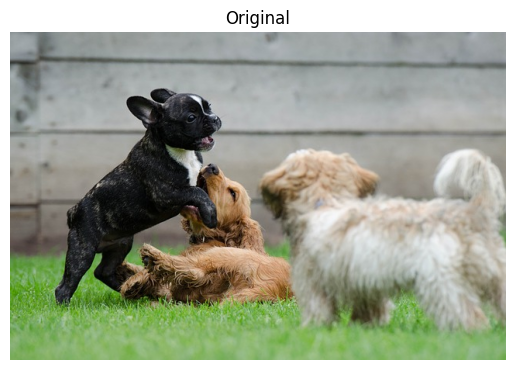

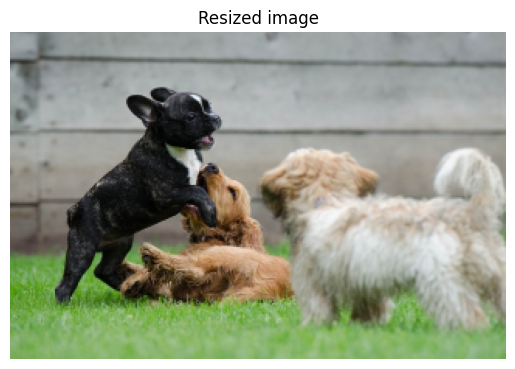

In [41]:
dogs_banner = plt.imread("dataset/chapter 2/dogs_banner.jpg")

# Set proportional height so its half its size
height = int(dogs_banner.shape[0] / 2)
width = int(dogs_banner.shape[1] / 2)

# Resize using the calculated proportional height and width
image_resized = resize(dogs_banner, (height, width),
                       anti_aliasing=True)

# Show the original and resized image
show_image(dogs_banner, 'Original')
show_image(image_resized, 'Resized image')


#### Morphology

Handwritten letters

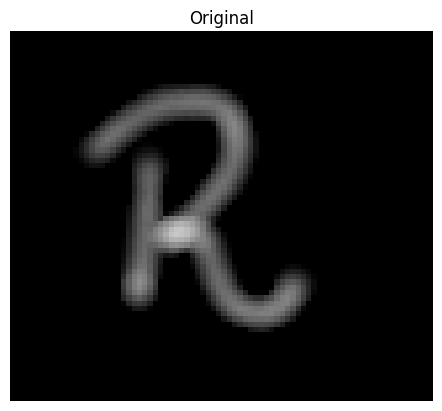

In [42]:
upper_r_image = plt.imread("dataset/chapter 2/r5.png")
show_image(upper_r_image, 'Original')

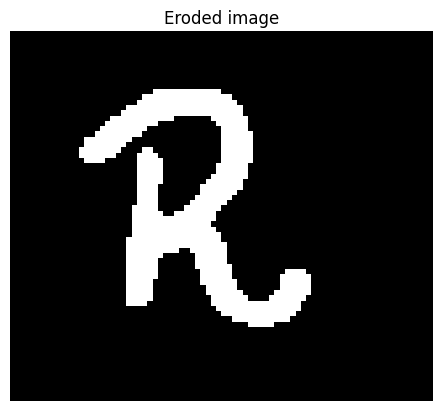

In [43]:
# Obtain the eroded shape 
eroded_image_shape = morphology.binary_erosion(upper_r_image) 
eroded_image_shape = eroded_image_shape.astype(np.float32)
show_image(eroded_image_shape, 'Eroded image')

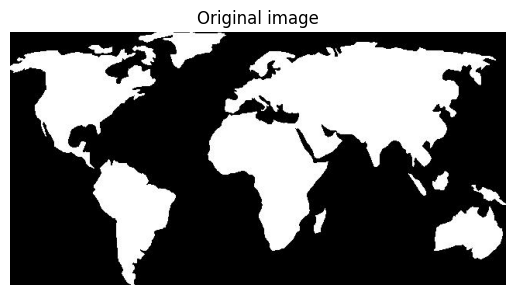

In [44]:
world_image_binary = plt.imread("dataset/chapter 2/world_image_binary.jpg")
show_image(world_image_binary, 'Original image')

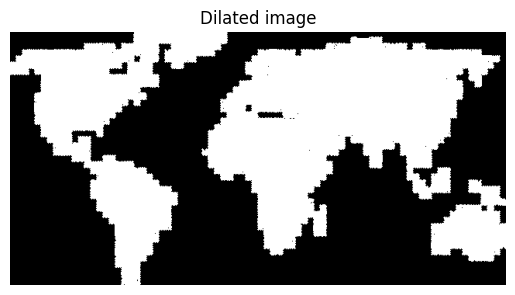

In [45]:
# Obtain the dilated image 
dilated_image = morphology.binary_dilation(world_image_binary)

show_image(dilated_image, 'Dilated image')

---------------------
### CH03: Image restoration, Noise, Segmentation and Contours

### Image restoration

In [61]:
from skimage.restoration import inpaint
import cv2


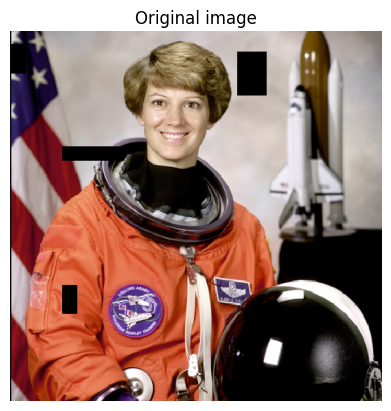

In [48]:
damaged_astronaut = plt.imread("dataset/chapter 3/damaged_astronaut.png")
show_image(damaged_astronaut, 'Original image')

In [52]:
damaged_astronaut.shape

(539, 542, 3)

In [97]:
def draw_canvas_around_rectangles(image):
    '''
    Draws colored outlines around the black rectangles in the image
    Returns a copy of the original image with rectangles outlined
    '''
    # Create a copy of the image to avoid modifying the original
    output_image = image.copy()
    
    # Define the rectangle coordinates [y1, y2, x1, x2]
    rectangles = [
        # Top-right black rectangle
        [30, 90, 330, 375],
    ]
    
    # Draw rectangles (using BGR color format for OpenCV)
    outline_color = (0, 255, 0)  # Green color
    line_thickness = 2
    
    for rect in rectangles:
        y1, y2, x1, x2 = rect
        # Draw rectangle outline
        cv2.rectangle(output_image, (x1, y1), (x2, y2), outline_color, line_thickness)
    
    return output_image

def process_astronaut_image(input_image_path, output_image_path):
    '''
    Processes the astronaut image by drawing outlines around black rectangles
    '''
    # Read the image
    image = cv2.imread(input_image_path)
    
    # Check if image was loaded properly
    if image is None:
        raise ValueError(f"Could not load image from {input_image_path}")
    
    # Convert from BGR to RGB if needed for display
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    # Draw outlines around black rectangles
    result = draw_canvas_around_rectangles(image_rgb)
    
    # Convert back to BGR for saving with OpenCV
    result_bgr = cv2.cvtColor(result, cv2.COLOR_RGB2BGR)
    
    # Save the result
    #cv2.imwrite(output_image_path, result_bgr)
    
    return result

(500.0, 0.0)

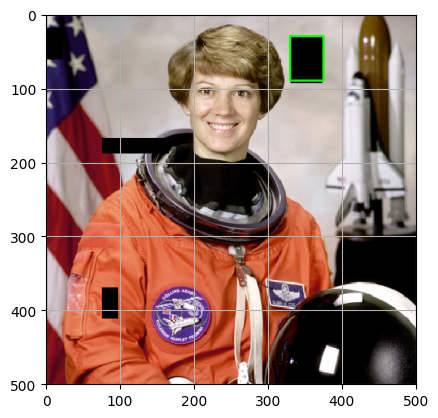

In [98]:
input_path = "dataset/chapter 3/damaged_astronaut.png"
output_path = "dataset/chapter 3/astronaut_with_outlines.jpg"

result = process_astronaut_image(input_path, output_path)
# Show the result
plt.imshow(result)
plt.grid(True)
plt.xlim(0, 500) # [30, 90, 330, 375],
plt.ylim(500, 0)

In [99]:
def get_mask(image):
    ''' Creates mask with three defect regions '''
    mask = np.zeros(image.shape[:-1])
    # Top-right black rectangle
    mask[30:100, 330:375] = 1
    return mask

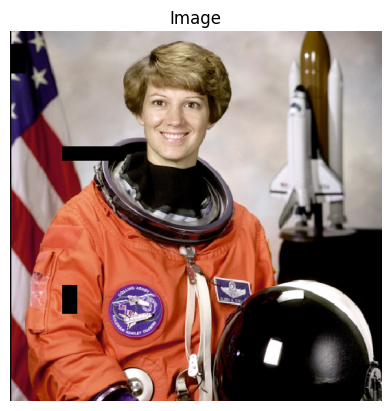

In [100]:
mask = get_mask(damaged_astronaut)
# Apply the restoration function to the image using the mask
restored_image = inpaint.inpaint_biharmonic(damaged_astronaut, mask, channel_axis=-1)
show_image(restored_image)

Removing logos

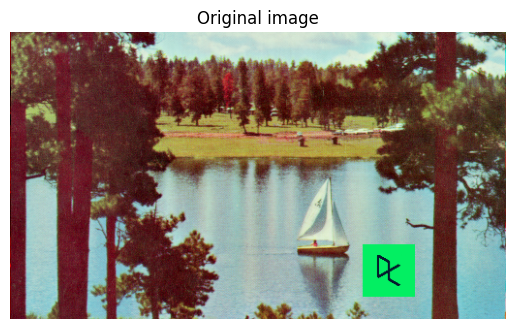

In [101]:
image_with_logo = plt.imread("dataset/chapter 3/image_with_logo.png")
show_image(image_with_logo, 'Original image')

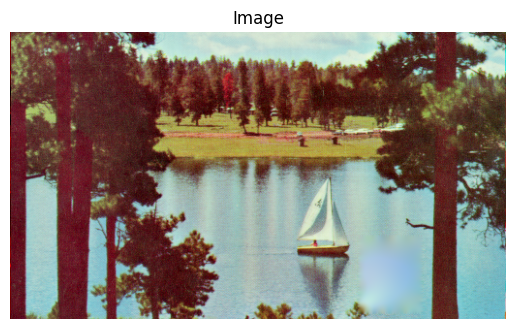

In [103]:
# Initialize the mask
mask = np.zeros(image_with_logo.shape[:-1])
# Define the logo region
mask[210:290, 360:425] = 1
restored_image = inpaint.inpaint_biharmonic(image_with_logo, mask, channel_axis=-1)
show_image(restored_image)

### Noise

In [113]:
from skimage.util import random_noise
from skimage.restoration import denoise_tv_chambolle
from skimage.restoration import denoise_bilateral

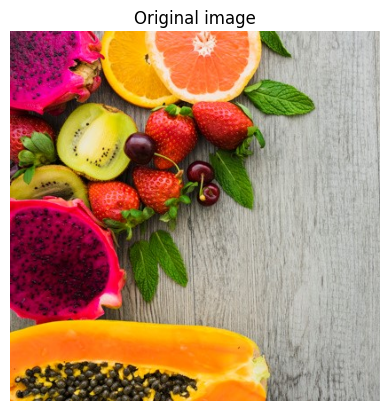

In [105]:
fruits_square = plt.imread("dataset/chapter 3/fruits_square.jpg")
show_image(fruits_square, 'Original image')

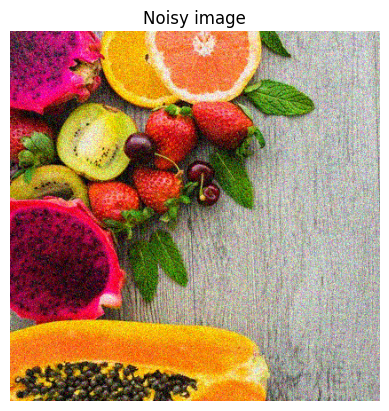

In [107]:
#  Add noise to the image
noisy_image = random_noise(fruits_square)
show_image(noisy_image, 'Noisy image')

denoise_tv_chambolle

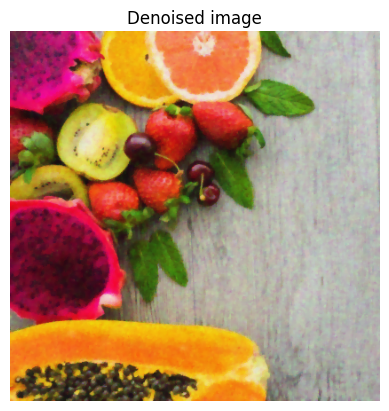

In [112]:
denoised_image = denoise_tv_chambolle(noisy_image, weight=0.1, channel_axis=-1)
show_image(denoised_image, 'Denoised image')

denoise_bilateral

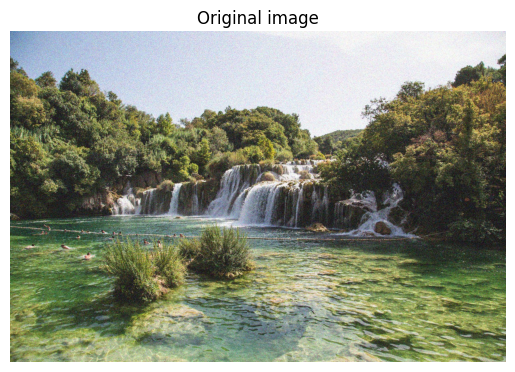

In [114]:
noise_noisy_nature = plt.imread("dataset/chapter 3/noise-noisy-nature.jpg")
show_image(noise_noisy_nature, 'Original image')

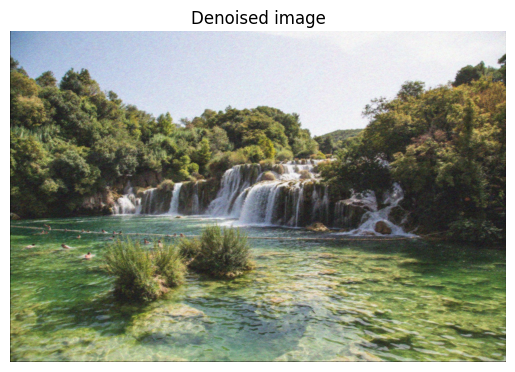

In [116]:
denoised_image = denoise_bilateral(noise_noisy_nature, channel_axis=-1)
show_image(denoised_image, 'Denoised image')

### Superpixels & segmentation


In [123]:
from skimage.segmentation import slic
from skimage.color import label2rgb

Superpixel segmentation

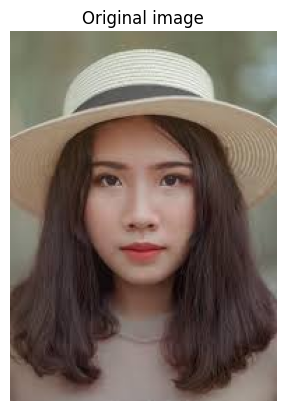

In [124]:
face_image = plt.imread("dataset/chapter 3/chinese.jpg")
show_image(face_image, 'Original image')

In [125]:
face_image.shape

(265, 191, 3)

In [126]:
num_of_pixels = face_image.shape[0] * face_image.shape[1]
num_of_pixels

50615

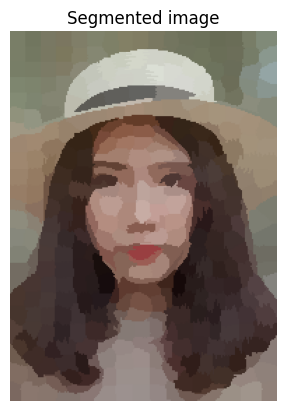

In [128]:
# 50615 pixels down to 400

# Obtain the segmentation with 400 regions
segments = slic(face_image, n_segments= 400)

# Put segments on top of original image to compare
segmented_image = label2rgb(segments, face_image, kind='avg')

show_image(segmented_image, 'Segmented image')

### Finding contours


In [129]:
from skimage import measure

Find contours of an image that is not binary

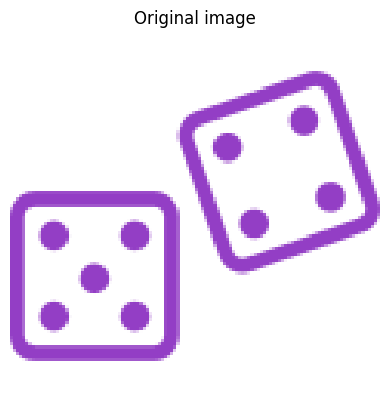

In [132]:
dices_image = plt.imread("dataset/chapter 3/dices.png")
show_image(dices_image, 'Original image')

In [135]:
dices_image.shape

(120, 120, 4)

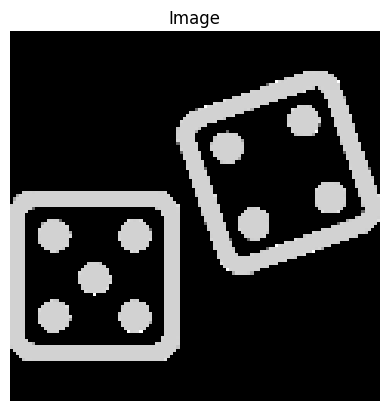

In [139]:
# Make the image grayscale
dices_image_gray = color.rgb2gray(dices_image[:, :, :3])
show_image(dices_image_gray)

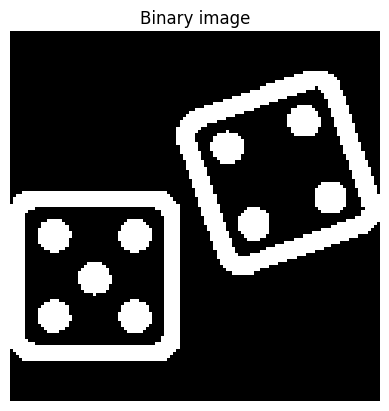

In [140]:
# Obtain the optimal thresh value
thresh = threshold_otsu(dices_image_gray)
# Apply thresholding to the image
binary_dices = dices_image_gray > thresh
show_image(binary_dices, 'Binary image')

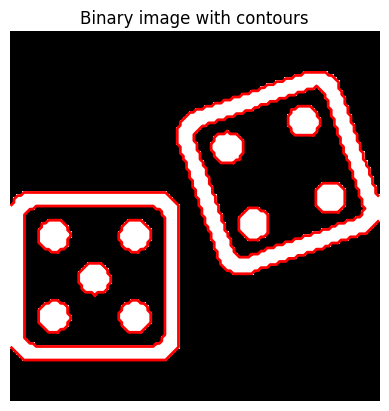

In [145]:
# Find contours at a constant value of 0.8
contours = measure.find_contours(binary_dices, 0.8)

# Plot the binary image
plt.imshow(binary_dices, cmap='gray')
plt.title('Binary image with contours')

# Overlay the contours
for contour in contours:
	plt.plot(contour[:, 1], contour[:, 0], linewidth=2, color='red')

plt.axis('off')
plt.show()

Count the dots in a dice's image

In [153]:
for contour in contours:
    print(contour.shape)

(255, 2)
(221, 2)
(43, 2)
(45, 2)
(41, 2)
(173, 2)
(181, 2)
(43, 2)
(45, 2)
(45, 2)
(45, 2)
(45, 2)
(45, 2)


In [148]:
# Create list with the shape of each contour
shape_contours = [cnt.shape[0] for cnt in contours]

# Set 50 as the maximum size of the dots shape
max_dots_shape = 50

# Count dots in contours excluding bigger than dots size
dots_contours = [cnt for cnt in contours if np.shape(cnt)[0] < max_dots_shape]

# Print the dice's number
print("Dice's dots number: {}. ".format(len(dots_contours)))


Dice's dots number: 9. 


---------
### CH04: Advanced Operations, Detecting Faces and Features

In [155]:
from skimage.feature import canny

Finding the edges with Canny

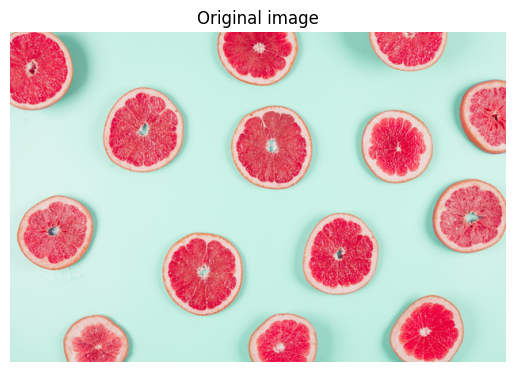

In [154]:
toronjas_image = plt.imread("dataset/chapter 4/toronjas.jpg")
show_image(toronjas_image, 'Original image')

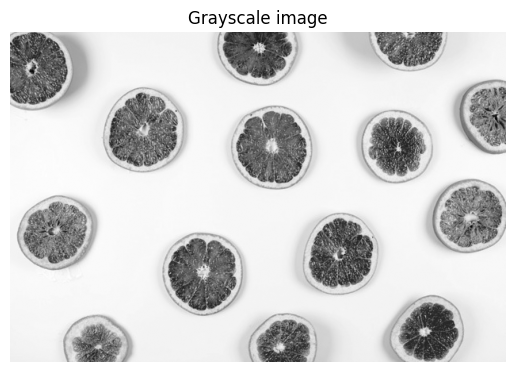

In [156]:
toronjas_image_gry = color.rgb2gray(toronjas_image)
show_image(toronjas_image_gry, 'Grayscale image')

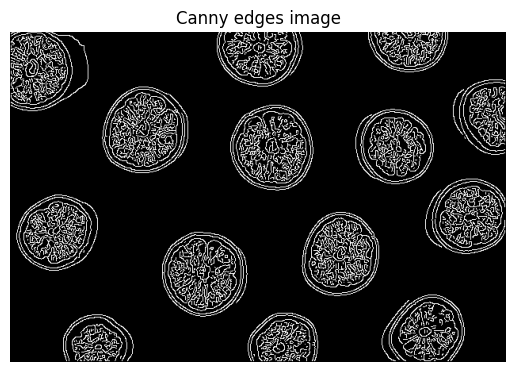

In [157]:
# Apply Canny detector
canny_edges = canny(toronjas_image_gry)
show_image(canny_edges, 'Canny edges image')

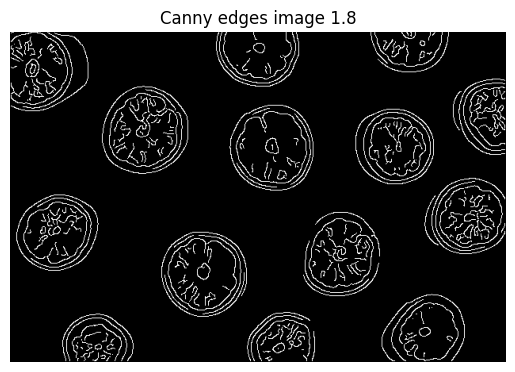

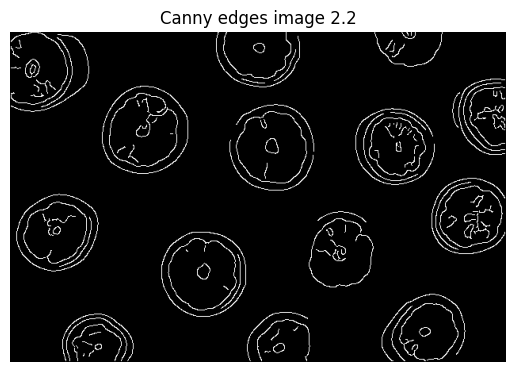

In [158]:
# Less edgy
edges_1_8 = canny(toronjas_image_gry, sigma=1.8)
edges_2_2 = canny(toronjas_image_gry, sigma=2.2)
show_image(edges_1_8, 'Canny edges image 1.8')
show_image(edges_2_2, 'Canny edges image 2.2')

Right around the corner

In [160]:
from skimage.feature import corner_harris, corner_peaks

In [162]:
def show_image_with_corners(image, coords, title="Corners detected"):
    plt.imshow(image, interpolation='nearest'
    , cmap='gray')
    plt.title(title)
    plt.plot(coords[:, 1], coords[:, 0],
    '+r'
    , markersize=15)
    plt.axis('off')
    plt.show()

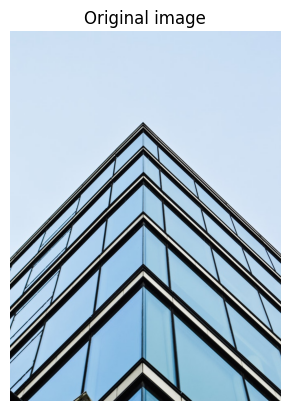

In [159]:
corners_building_top = plt.imread("dataset/chapter 4/corners_building_top.jpg")
show_image(corners_building_top, 'Original image')

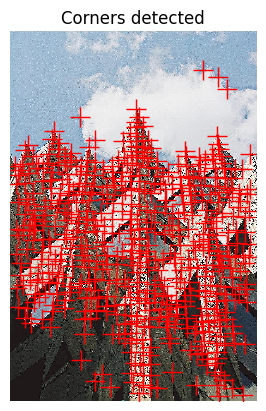

In [163]:
# Convert image from RGB-3 to grayscale
building_image_gray = color.rgb2gray(building_image)

# Apply the detector  to measure the possible corners
measure_image = corner_harris(building_image_gray)

# Find the peaks of the corners using the Harris detector
coords = corner_peaks(measure_image, min_distance=20, threshold_rel=0.02)

# Plot the image
show_image_with_corners(building_image, coords)

In [165]:
# Find the peaks with a min distance of 10 pixels
coords_w_min_10 = corner_peaks(measure_image, min_distance=10, threshold_rel=0.02)
print("With a min_distance set to 10, we detect a total", len(coords_w_min_10), "corners in the image.")


# Find the peaks with a min distance of 60 pixels
coords_w_min_60 = corner_peaks(measure_image, min_distance = 60, threshold_rel=0.02)
print("With a min_distance set to 60, we detect a total", len(coords_w_min_60), "corners in the image.")

With a min_distance set to 10, we detect a total 1392 corners in the image.
With a min_distance set to 60, we detect a total 67 corners in the image.


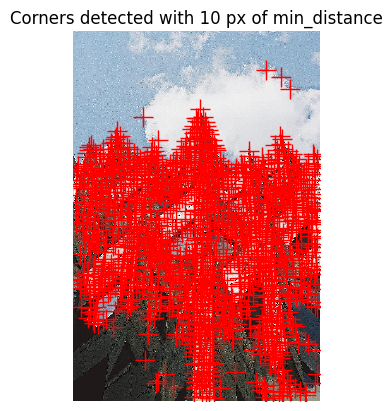

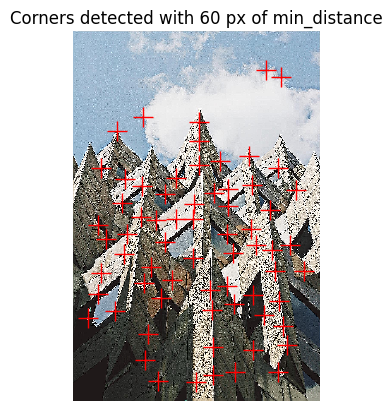

In [ ]:
# Show original and resulting image with corners detected
show_image_with_corners(building_image, coords_w_min_10, "Corners detected with 10 px of min_distance")
show_image_with_corners(building_image, coords_w_min_60, "Corners detected with 60 px of min_distance")

### Face detection

In [168]:
from skimage.feature import Cascade


In [174]:
from matplotlib import patches

def show_detected_face(result, detected, title="Face image"):
    plt.imshow(result)
    img_desc = plt.gca()
    plt.set_cmap('gray')
    plt.title(title)
    plt.axis('off')
    for patch in detected:
        img_desc.add_patch(
            patches.Rectangle(
                (patch['c'], patch['r']),
                patch['width'],
                patch['height'],
                fill=False,color='r'
                ,linewidth=2)
        )
    plt.show()

Is someone there?

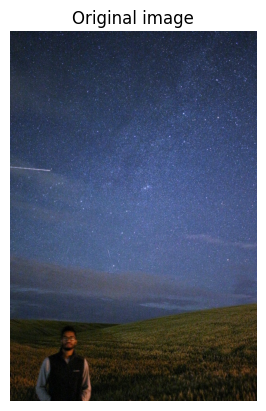

In [167]:
face_det3 = plt.imread("dataset/chapter 4/face_det3.jpg")
show_image(face_det3, 'Original image')

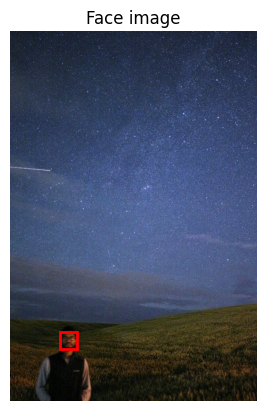

In [175]:
# Load the trained file from data
trained_file = data.lbp_frontal_face_cascade_filename()

# Initialize the detector cascade
detector = Cascade(trained_file)

# Detect faces with min and max size of searching window
detected = detector.detect_multi_scale(img = face_det3,
                                       scale_factor=1.2,
                                       step_ratio=1,
                                       min_size=(10,10),
                                       max_size=(200,200))

# Show the detected faces
show_detected_face(face_det3, detected)

Multiple faces

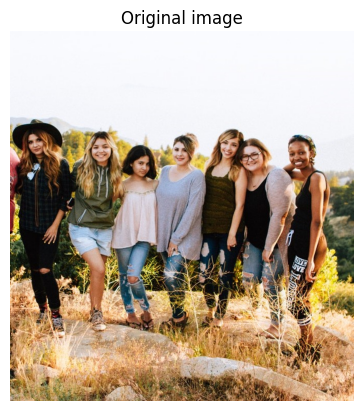

In [176]:
friends_image = plt.imread("dataset/chapter 4/face_det_friends22.jpg")
show_image(friends_image, 'Original image')

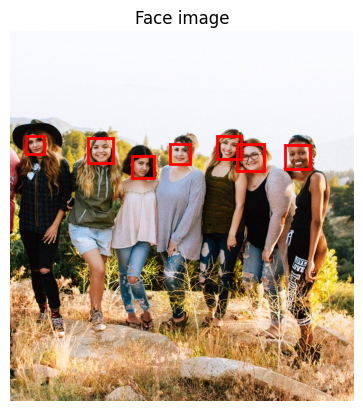

In [177]:
# Load the trained file from data
trained_file = data.lbp_frontal_face_cascade_filename()

# Initialize the detector cascade
detector = Cascade(trained_file)

# Detect faces with scale factor to 1.2 and step ratio to 1
detected = detector.detect_multi_scale(img=friends_image,
                                       scale_factor=1.2,
                                       step_ratio=1,
                                       min_size=(10, 10),
                                       max_size=(200, 200))
# Show the detected faces
show_detected_face(friends_image, detected)

Segmentation and face detection

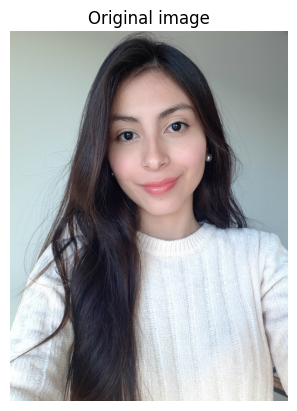

In [178]:
profile_image = plt.imread("dataset/chapter 4/face_det9.jpg")
show_image(profile_image, 'Original image')

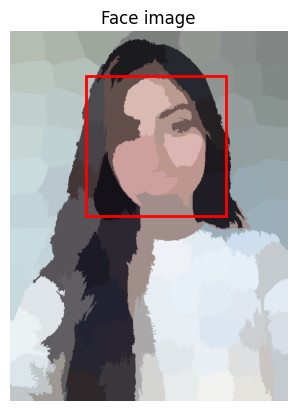

In [179]:
# Obtain the segmentation with default 100 regions
segments = slic(profile_image, n_segments= 100)

# Obtain segmented image using label2rgb
segmented_image = label2rgb(segments, profile_image, kind='avg')

# Detect the faces with multi scale method
detected = detector.detect_multi_scale(img=segmented_image, 
                                       scale_factor=1.2, 
                                       step_ratio=1, 
                                       min_size=(10, 10), max_size=(1000, 1000))

# Show the detected faces
show_detected_face(segmented_image, detected)

### Real-world applications

Privacy protection

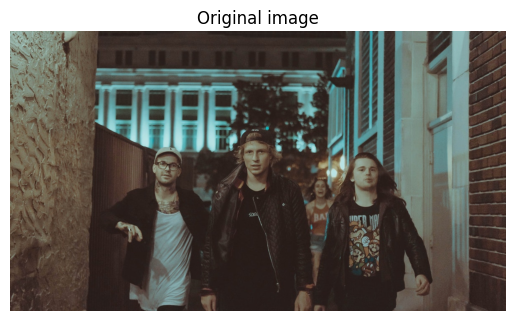

In [180]:
group_image = plt.imread("dataset/chapter 4/face_det25.jpg")
show_image(group_image, 'Original image')

In [181]:
# Load the trained file from data
trained_file = data.lbp_frontal_face_cascade_filename()

# Initialize the detector cascade
detector = Cascade(trained_file)

# Detect the faces with multi scale method
detected = detector.detect_multi_scale(img=group_image, 
                                       scale_factor=1.2, 
                                       step_ratio=1, 
                                       min_size=(10, 10), max_size=(100, 100))

In [188]:
def getFaceRectangle(d, image):
    ''' Extracts the face rectangle from the image using the
    coordinates of the detected.
    '''
    # X and Y starting points of the face rectangle
    x, y = d['r'], d['c']
    # The width and height of the face rectangle
    width, height = d['r'] + d['width'], d['c'] + d['height']
    # Extract the detected face
    face = image[x:width, y:height]
    return face

In [189]:
def mergeBlurryFace(d, original, gaussian_image):
    # X and Y starting points of the face rectangle
    x, y = d['r'], d['c']
    # The width and height of the face rectangle
    width, height = d['r'] + d['width'], d['c'] + d['height']
    original[ x:width, y:height] = gaussian_image
    return original

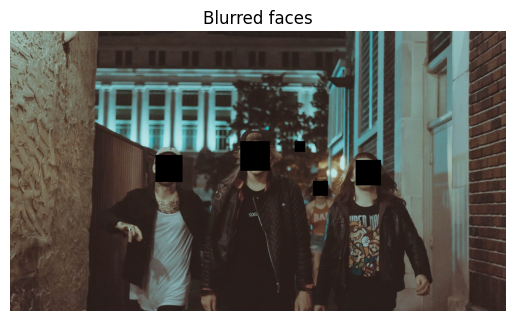

In [192]:
# Make a writable copy of the group_image
writable_group_image = group_image.copy()

# For each detected face
for d in detected:  
    # Obtain the face rectangle from detected coordinates
    face = getFaceRectangle(d, writable_group_image)
    
    # Apply gaussian filter to extracted face
    blurred_face = gaussian(face, channel_axis=-1, sigma = 8)
    
    # Merge this blurry face to our final image and show it
    resulting_image = mergeBlurryFace(d, writable_group_image, blurred_face) 
show_image(resulting_image, "Blurred faces")

Help Sally restore her graduation photo

In [195]:
from skimage.restoration import denoise_tv_chambolle, inpaint
from skimage import transform

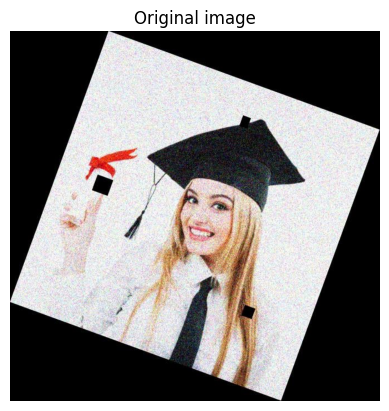

In [194]:
damaged_image = plt.imread("dataset/chapter 4/sally2.jpg")
show_image(damaged_image, 'Original image')

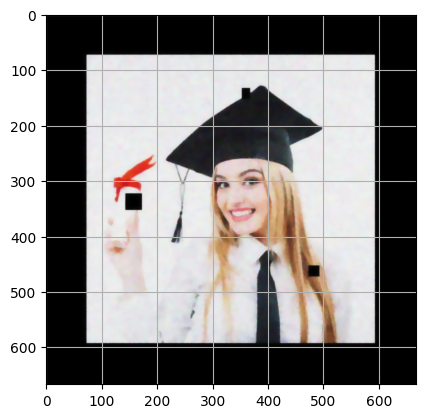

In [197]:
# Transform the image so it's not rotated
upright_img = rotate(damaged_image, 20)

# Remove noise from the image, using the chambolle method
upright_img_without_noise = denoise_tv_chambolle(upright_img,weight=0.1, channel_axis=-1)

plt.imshow(upright_img_without_noise)
plt.grid(True)

In [212]:
def get_mask(image):
    ''' Creates mask with three defect regions '''
    mask = np.zeros(image.shape[:-1])
    # Top-right black rectangle
    mask[320:360, 140:180] = 1
    mask[440:480, 460:500] = 1
    return mask

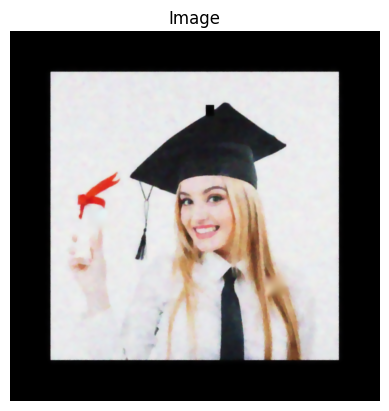

In [213]:
# Reconstruct the image missing parts
mask = get_mask(upright_img)
result = inpaint.inpaint_biharmonic(upright_img_without_noise, mask, channel_axis=-1)

show_image(result)

------------
## Thank you (^​_^）